<a href="https://colab.research.google.com/github/smritigithubacc/ML-projects/blob/main/ATM_ANALYSIS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd

In [ ]:
df=pd.read_csv('sbi_raw_prepared_data.csv')
df.head(10)

,ds_pincode,ds_district,ds_state,ds_pincode_category,caldate,ev_dt,tx_cn_t_w,atmid_current,account,lob,...,income,footfall,market_concentration,market_presence,office_concentration,office_presence,affluence,HIG%,MIG%,LIG%
0,690534,alappuzha,kerala,rural,2021-10-01,1612.0,3636.0,T1NY005626105,SBI,ATM,...,23200.0,100.0,1.0,None,0.0,None,1114000.0,0.0,5.07,94.93
1,690534,alappuzha,kerala,rural,2021-11-01,1446.0,3212.0,T1NY005626105,SBI,ATM,...,23200.0,100.0,1.0,None,0.0,None,1114000.0,0.0,5.07,94.93
2,690534,alappuzha,kerala,rural,2021-12-01,2543.0,3978.0,T1NY005626105,SBI,ATM,...,23200.0,100.0,1.0,None,0.0,None,1114000.0,0.0,5.07,94.93
3,690534,alappuzha,kerala,rural,2022-01-01,276.0,3984.0,T1NY005626105,SBI,ATM,...,23200.0,100.0,1.0,None,0.0,None,1114000.0,0.0,5.07,94.93
4,690534,alappuzha,kerala,rural,2022-02-01,141.0,3795.0,T1NY005626105,SBI,ATM,...,23200.0,100.0,1.0,None,0.0,None,1114000.0,0.0,5.07,94.93
5,690534,alappuzha,kerala,rural,2022-03-01,330.0,3856.0,T1NY005626105,SBI,ATM,...,23200.0,100.0,1.0,None,0.0,None,1114000.0,0.0,5.07,94.93
6,690534,alappuzha,kerala,rural,2022-04-01,1066.0,3996.0,T1NY005626105,SBI,ATM,...,23200.0,100.0,1.0,None,0.0,None,1114000.0,0.0,5.07,94.93
7,690534,alappuzha,kerala,rural,2022-05-01,2525.0,3663.0,T1NY005626105,SBI,ATM,...,23200.0,100.0,1.0,None,0.0,None,1114000.0,0.0,5.07,94.93
8,690534,alappuzha,kerala,rural,2022-06-01,1067.0,3420.0,T1NY005626105,SBI,ATM,...,23200.0,100.0,1.0,None,0.0,None,1114000.0,0.0,5.07,94.93
9,690534,alappuzha,kerala,rural,2022-07-01,459.0,3674.0,T1NY005626105,SBI,ATM,...,23200.0,100.0,1.0,None,0.0,None,1114000.0,0.0,5.07,94.93


In [ ]:
df.columns.values.tolist()

['ds_pincode',
 'ds_district',
 'ds_state',
 'ds_pincode_category',
 'caldate',
 'ev_dt',
 'tx_cn_t_w',
 'atmid_current',
 'account',
 'lob',
 'psid',
 'liveDate',
 'closeDate',
 'State',
 'District',
 'City',
 'Address',
 'latitude',
 'longitude',
 'hash',
 'ATM_count(500m)',
 'insurance_agent_count(500m)',
 'BC_agent_count(500m)',
 'bank_count(500m)',
 'msme_count(500m)',
 'warehouse_count(500m)',
 'pharmacy_count(500m)',
 'hospital_count(500m)',
 'diagnostic_centre_count(500m)',
 'restaurant_count(500m)',
 'cafe_count(500m)',
 'doctor_clinic_count(500m)',
 'park_count(500m)',
 'mass_media_entertainment_count(500m)',
 'lodging_count(500m)',
 'petrol_pump_count(500m)',
 'travel_agent_count(500m)',
 'event_venue_count(500m)',
 'religious_place_count(500m)',
 'office_count(500m)',
 'apartment_complex_count(500m)',
 'automotive_repair_and_maintenance_count(500m)',
 'service_centre_count(500m)',
 'other_store_count(500m)',
 'jewellery_store_count(500m)',
 'wholesaler_count(500m)',
 'cloth

In [ ]:
df['atmid_current'].nunique()

4420

In [ ]:
# Group by 'atmid_current' and calculate the sum of 'Actual' transactions for each 'atmid_current'
# In 1 atm there can be many transactions , hence summing them  and find mean of all the other parameters as they are same for every repeating atm id


columns_to_agg = {
  'ATM_count(500m)': 'mean',
  'insurance_agent_count(500m)': 'mean',
  'BC_agent_count(500m)': 'mean',
  'bank_count(500m)': 'mean',
 'msme_count(500m)':'mean',
 'warehouse_count(500m)':'mean',
 'pharmacy_count(500m)':'mean',
 'hospital_count(500m)':'mean',
 'diagnostic_centre_count(500m)':'mean',
 'restaurant_count(500m)':'mean',
 'cafe_count(500m)':'mean',
 'doctor_clinic_count(500m)':'mean',
 'park_count(500m)':'mean',
 'mass_media_entertainment_count(500m)':'mean',
 'lodging_count(500m)':'mean',
 'petrol_pump_count(500m)':'mean',
 'travel_agent_count(500m)':'mean',
 'event_venue_count(500m)':'mean',
 'religious_place_count(500m)':'mean',
 'office_count(500m)':'mean',
 'apartment_complex_count(500m)':'mean',
 'automotive_repair_and_maintenance_count(500m)':'mean',
 'service_centre_count(500m)':'mean',
 'other_store_count(500m)':'mean',
 'jewellery_store_count(500m)':'mean',
 'wholesaler_count(500m)':'mean',
 'clothing_store_count(500m)':'mean',
 'beauty_and_salon_count(500m)':'mean',
 'grocery_count(500m)':'mean',
 'manufacturer_count(500m)':'mean',
 'farmer_market_count(500m)':'mean',
 'pet_store_count(500m)':'mean',
 'stationary_and_xerox_shop_count(500m)':'mean',
 'liquor_shop_count(500m)':'mean',
 'automotive_showroom_count(500m)':'mean',
 'gym_count(500m)':'mean',
 'school_count(500m)':'mean',
 'money_transfer_service_count(500m)':'mean',
 'college_and_university_count(500m)':'mean',
 'social_service_count(500m)':'mean',
 'others_count(500m)':'mean',
 'mall_count(500m)':'mean',
 'bus_stop_count(500m)':'mean',
 'bus_station_count(500m)':'mean',
 'police_station_count(500m)':'mean',
 'airport_count(500m)':'mean',

 'income':'mean',
 'footfall':'mean',
 'market_concentration':'mean',

 'office_concentration':'mean',

 'affluence':'mean',
  'tx_cn_t_w': 'sum'

 }




# Group by 'atmid_current' and calculate the mean for selected columns and sum for 'tx_cn_t_w'
result_df = df.groupby('atmid_current').agg(columns_to_agg).reset_index()

print(result_df)

      atmid_current  ATM_count(500m)  insurance_agent_count(500m)  \
0     T1BH000003039              1.0                          1.0   
1     T1BH000003040              0.0                          1.0   
2     T1BH000003041              0.0                          0.0   
3     T1BH000006150              3.0                          0.0   
4     T1BH000006151              5.0                          1.0   
...             ...              ...                          ...   
4415  T1NY070259013              1.0                          1.0   
4416  T1NY070334025              1.0                          0.0   
4417  T1NY070502089              0.0                          0.0   
4418  T1NY070502090              0.0                          0.0   
4419  T1NY070502092              1.0                          1.0   

      BC_agent_count(500m)  bank_count(500m)  msme_count(500m)  \
0                      7.0               0.0               6.0   
1                      7.0             

In [ ]:
#performing EDA


In [ ]:
numerical_cols = result_df.select_dtypes(include='float64').columns

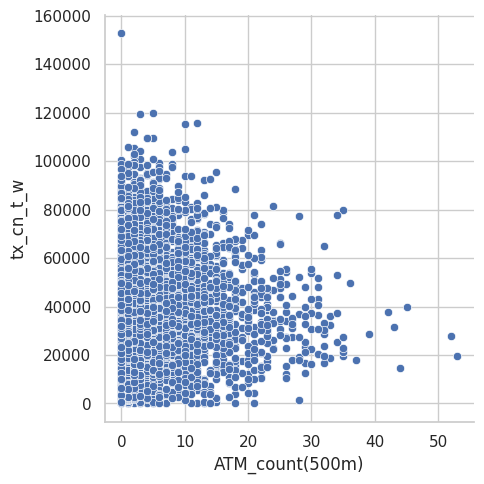

In [ ]:
#plotting all variables against 1 target variable  to observe for outliers
import seaborn as sns
sns.relplot(x = 'ATM_count(500m)', y ='tx_cn_t_w',data = result_df)

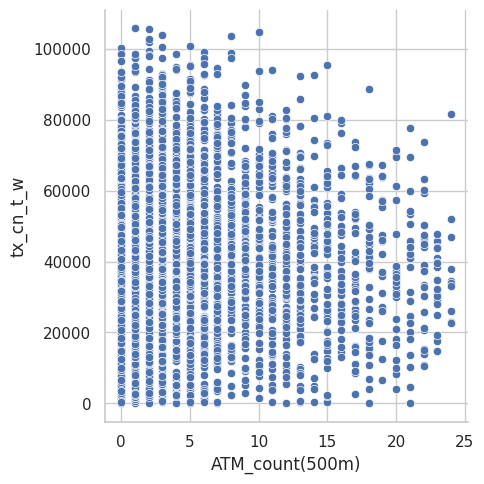

In [ ]:
# Remove outliers by calculating standard deviation of all points . If more than threshold then discard them
from scipy.stats import zscore
# Calculate Z-scores for the two columns
z_scores = zscore(result_df[['ATM_count(500m)', 'tx_cn_t_w']])

# Remove outliers based on Z-scores
threshold = 3
result_df = result_df[(z_scores.abs() < threshold).all(axis=1)]

# Re-create the scatter plot without outliers
sns.relplot(x='ATM_count(500m)', y='tx_cn_t_w', data=result_df)

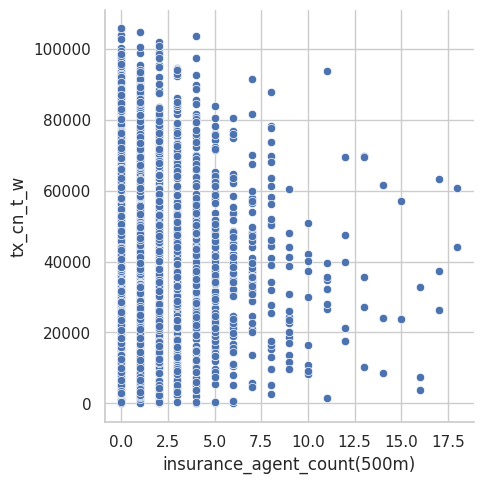

In [ ]:
import seaborn as sns
sns.relplot(x ='insurance_agent_count(500m)', y ='tx_cn_t_w',data = result_df)

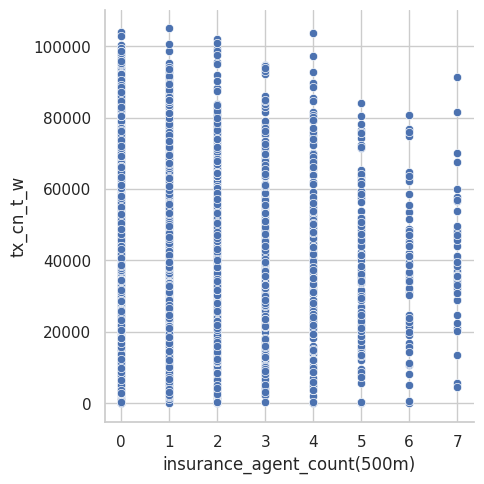

In [ ]:
# Calculate Z-scores for the two columns
z_scores = zscore(result_df[['insurance_agent_count(500m)', 'tx_cn_t_w']])

# Remove outliers based on Z-scores
threshold = 3
result_df = result_df[(z_scores.abs() < threshold).all(axis=1)]

# Re-create the scatter plot without outliers
sns.relplot(x='insurance_agent_count(500m)', y='tx_cn_t_w', data=result_df)

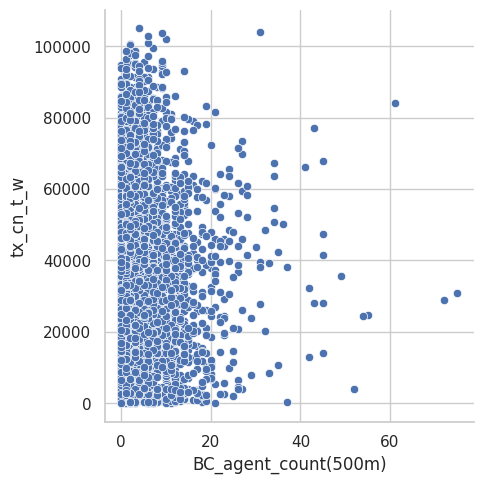

In [ ]:
import seaborn as sns
sns.relplot(x ='BC_agent_count(500m)', y ='tx_cn_t_w',data = result_df)

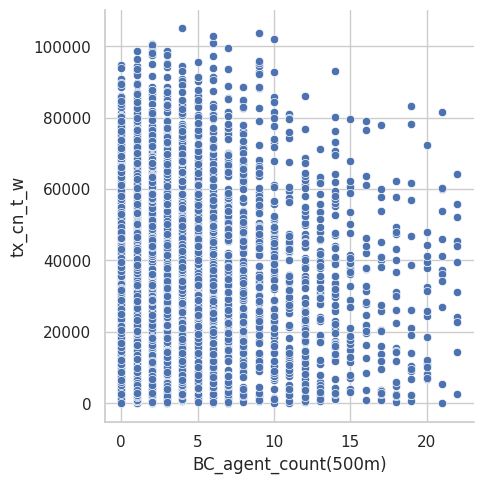

In [ ]:
# Calculate Z-scores for the two columns
z_scores = zscore(result_df[['BC_agent_count(500m)', 'tx_cn_t_w']])

# Remove outliers based on Z-scores
threshold = 3
result_df = result_df[(z_scores.abs() < threshold).all(axis=1)]

# Re-create the scatter plot without outliers
sns.relplot(x='BC_agent_count(500m)', y='tx_cn_t_w', data=result_df)

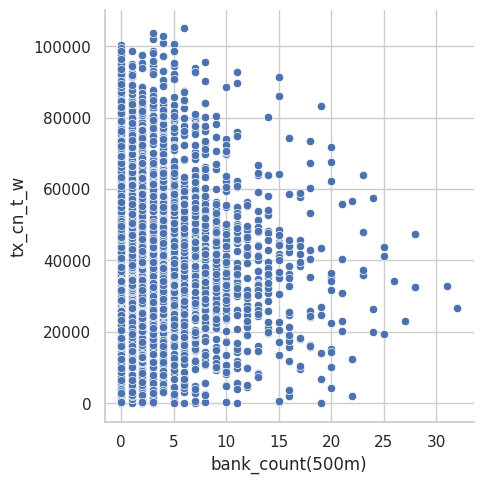

In [ ]:
import seaborn as sns
sns.relplot(x ='bank_count(500m)', y ='tx_cn_t_w',data = result_df)



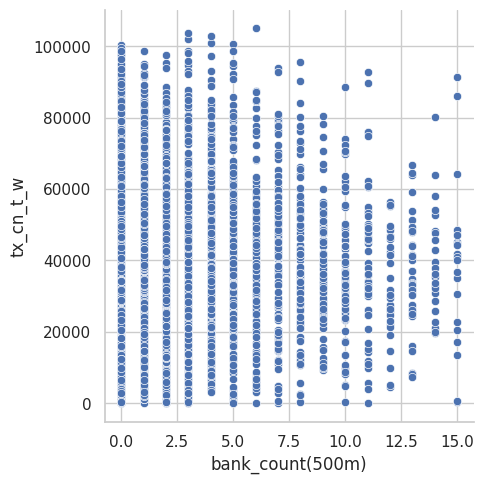

In [ ]:
# Calculate Z-scores for the two columns
z_scores = zscore(result_df[['bank_count(500m)', 'tx_cn_t_w']])

# Remove outliers based on Z-scores
threshold = 3
result_df = result_df[(z_scores.abs() < threshold).all(axis=1)]

# Re-create the scatter plot without outliers
sns.relplot(x='bank_count(500m)', y='tx_cn_t_w', data=result_df)

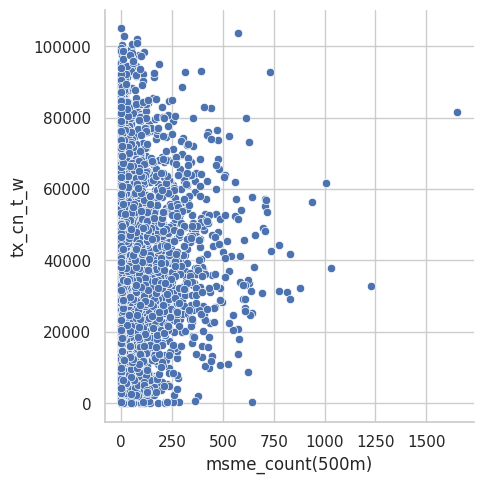

In [ ]:
import seaborn as sns
sns.relplot(x ='msme_count(500m)', y ='tx_cn_t_w',data = result_df)


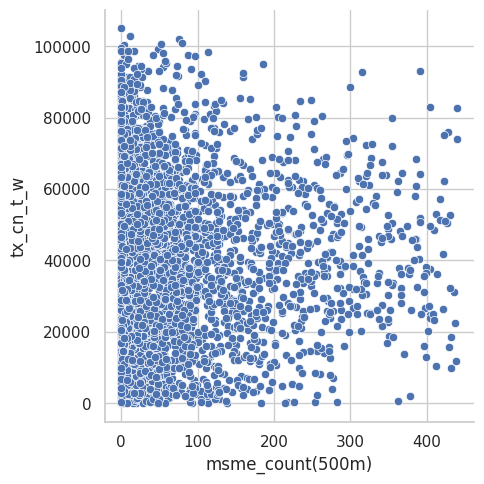

In [ ]:
# Calculate Z-scores for the two columns
z_scores = zscore(result_df[['msme_count(500m)', 'tx_cn_t_w']])

# Remove outliers based on Z-scores
threshold = 3
result_df = result_df[(z_scores.abs() < threshold).all(axis=1)]

# Re-create the scatter plot without outliers
sns.relplot(x='msme_count(500m)', y='tx_cn_t_w', data=result_df)

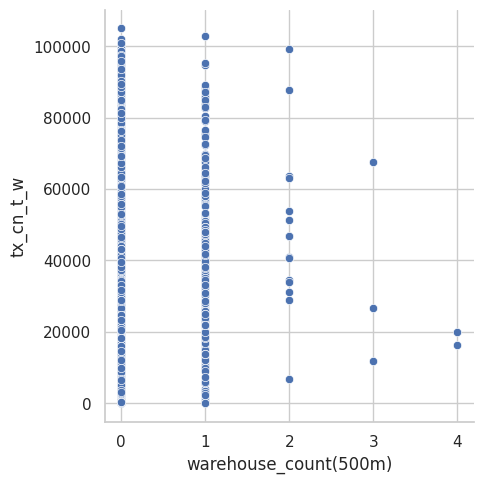

In [ ]:
import seaborn as sns
sns.relplot(x ='warehouse_count(500m)', y ='tx_cn_t_w',data = result_df)
#no outliers

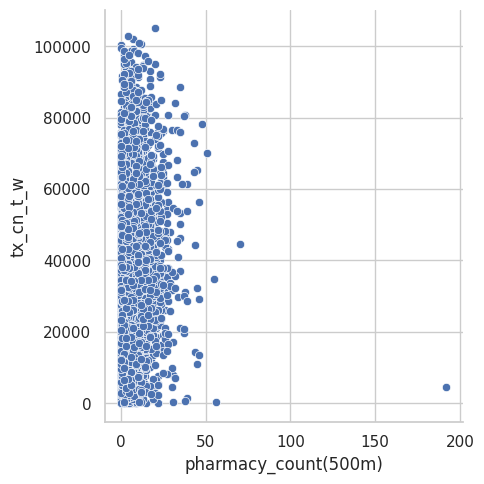

In [ ]:
import seaborn as sns
sns.relplot(x ='pharmacy_count(500m)', y ='tx_cn_t_w',data = result_df)
# no outliers

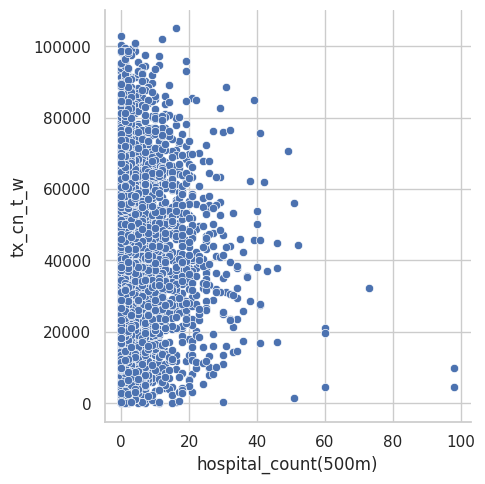

In [ ]:
import seaborn as sns
sns.relplot(x ='hospital_count(500m)', y ='tx_cn_t_w',data = result_df)

In [ ]:
result_df.columns.values.tolist()


['atmid_current',
 'ATM_count(500m)',
 'insurance_agent_count(500m)',
 'BC_agent_count(500m)',
 'bank_count(500m)',
 'msme_count(500m)',
 'warehouse_count(500m)',
 'pharmacy_count(500m)',
 'hospital_count(500m)',
 'diagnostic_centre_count(500m)',
 'restaurant_count(500m)',
 'cafe_count(500m)',
 'doctor_clinic_count(500m)',
 'park_count(500m)',
 'mass_media_entertainment_count(500m)',
 'lodging_count(500m)',
 'petrol_pump_count(500m)',
 'travel_agent_count(500m)',
 'event_venue_count(500m)',
 'religious_place_count(500m)',
 'office_count(500m)',
 'apartment_complex_count(500m)',
 'automotive_repair_and_maintenance_count(500m)',
 'service_centre_count(500m)',
 'other_store_count(500m)',
 'jewellery_store_count(500m)',
 'wholesaler_count(500m)',
 'clothing_store_count(500m)',
 'beauty_and_salon_count(500m)',
 'grocery_count(500m)',
 'manufacturer_count(500m)',
 'farmer_market_count(500m)',
 'pet_store_count(500m)',
 'stationary_and_xerox_shop_count(500m)',
 'liquor_shop_count(500m)',
 'au

In [ ]:
result_df.isnull().sum()

atmid_current                                    0
ATM_count(500m)                                  0
insurance_agent_count(500m)                      0
BC_agent_count(500m)                             0
bank_count(500m)                                 0
msme_count(500m)                                 0
warehouse_count(500m)                            0
pharmacy_count(500m)                             0
hospital_count(500m)                             0
diagnostic_centre_count(500m)                    0
restaurant_count(500m)                           0
cafe_count(500m)                                 0
doctor_clinic_count(500m)                        0
park_count(500m)                                 0
mass_media_entertainment_count(500m)             0
lodging_count(500m)                              0
petrol_pump_count(500m)                          0
travel_agent_count(500m)                         0
event_venue_count(500m)                          0
religious_place_count(500m)    

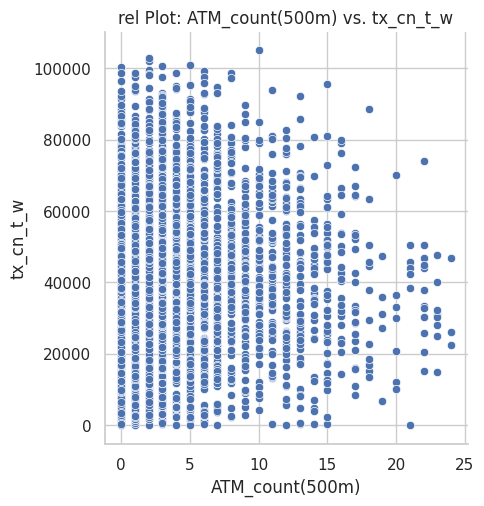

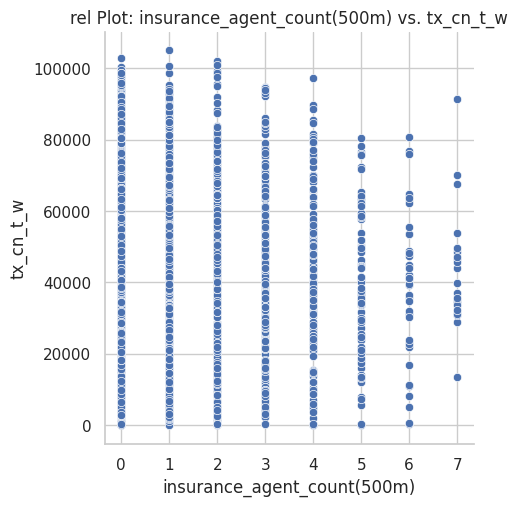

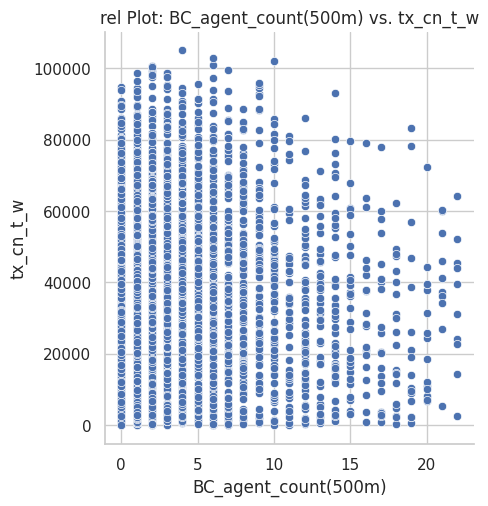

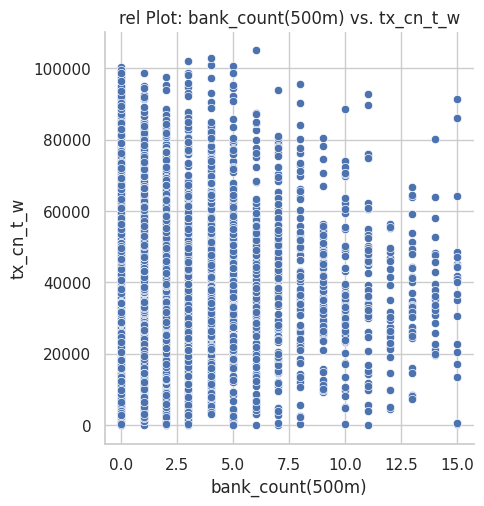

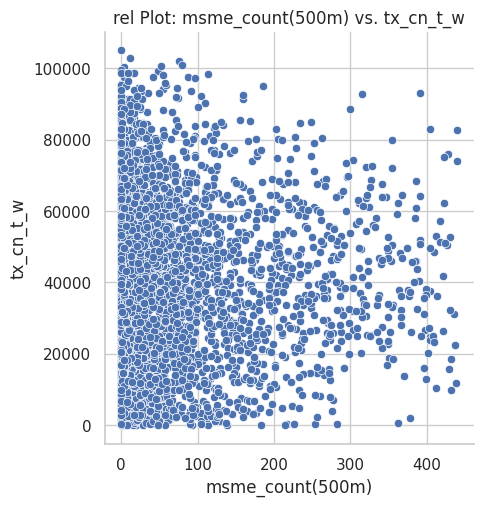

...

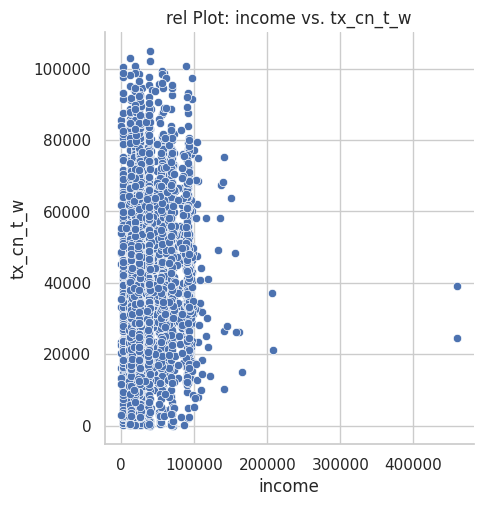

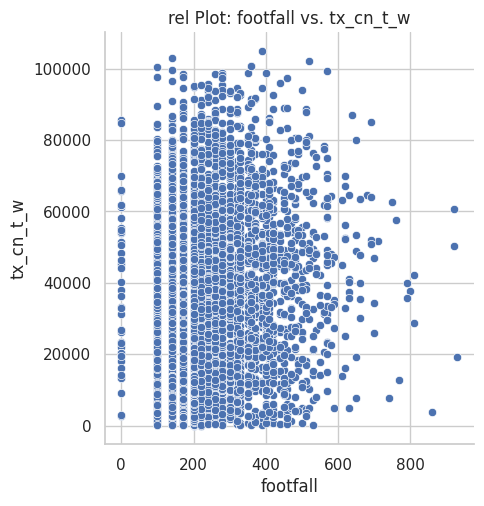

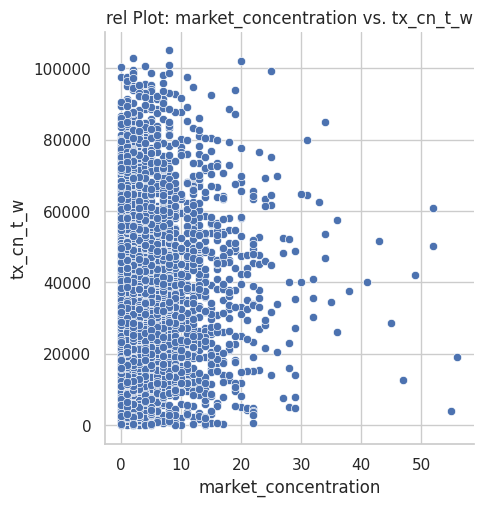

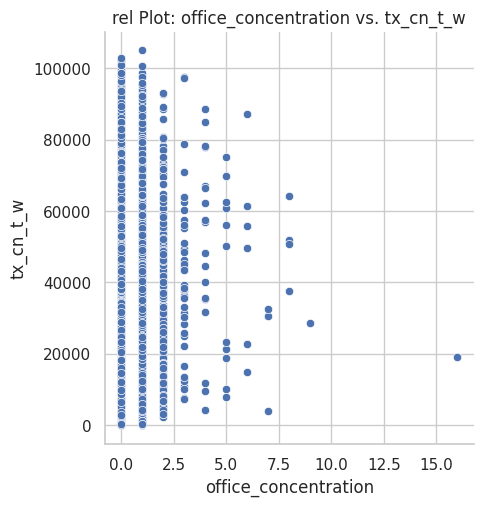

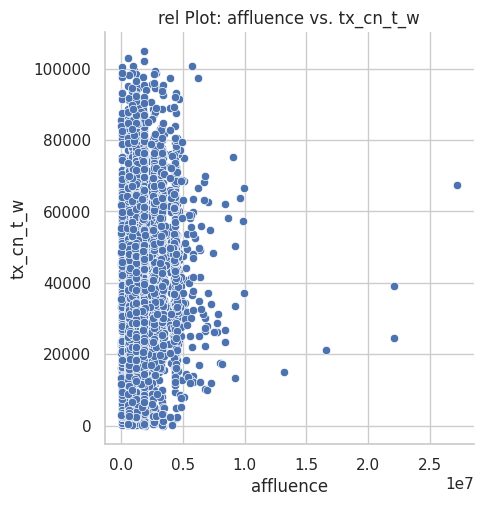

In [ ]:
import matplotlib.pyplot as plt


# Define the target variable (replace 'target_column' with the actual name of the target column)
target_column = 'tx_cn_t_w'


# together plot all outliers for all columns against target variable

# Extract numerical columns (exclude the target column)
numerical_cols = result_df.select_dtypes(include='float64').drop(columns=[target_column]).columns

# Create scatter plots between each numerical column and the target variable
for col in numerical_cols:
    sns.relplot(x=result_df[col], y=result_df[target_column])
    plt.title(f'rel Plot: {col} vs. {target_column}')
    plt.xlabel(col)
    plt.ylabel(target_column)
    plt.show()



In [ ]:
new_cols=['msme_count(500m)','pharmacy_count(500m)',
 'hospital_count(500m)','diagnostic_centre_count(500m)',
 'restaurant_count(500m)',
 'cafe_count(500m)','park_count(500m)','lodging_count(500m)','travel_agent_count(500m)','religious_place_count(500m)',
 'office_count(500m)',
 'apartment_complex_count(500m)',
 'automotive_repair_and_maintenance_count(500m)',
 'service_centre_count(500m)',
 'other_store_count(500m)',
 'jewellery_store_count(500m)',
 'wholesaler_count(500m)',
 'clothing_store_count(500m)',
 'beauty_and_salon_count(500m)',
 'grocery_count(500m)',
 'manufacturer_count(500m)','school_count(500m)','income',
 'footfall',
 'market_concentration',
 'office_concentration',
 'affluence']
 # see what has outliers and only include that columns into this df
 # Convert selected columns to numeric data types (if needed)
result_df[new_cols] = result_df[new_cols].apply(pd.to_numeric, errors='coerce')


In [ ]:
from scipy.stats import zscore
# Calculate Z-scores and remove outliers for each specific column
z_scores = pd.DataFrame()

for col in new_cols:
    z_scores[col] = zscore(result_df[col], ddof=1)


# Set the threshold for outlier removal (you can adjust this threshold as needed)
threshold = 3

# Create a boolean mask to identify rows with outliers in any numerical column
outliers_mask = (z_scores.abs() >= threshold).any(axis=1)

# Remove rows with outliers from the DataFrame
data_no_outliers = result_df[~outliers_mask]



<Figure size 1800x1500 with 0 Axes>

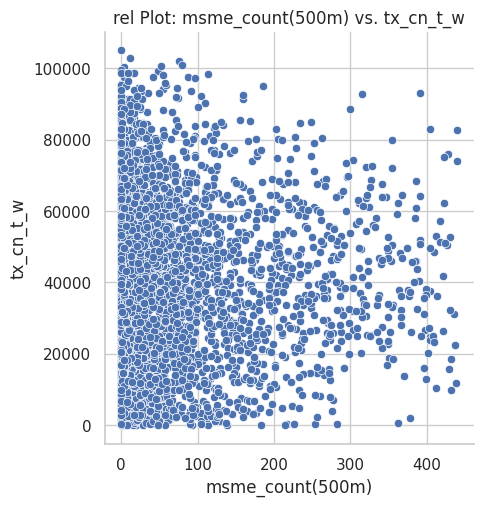

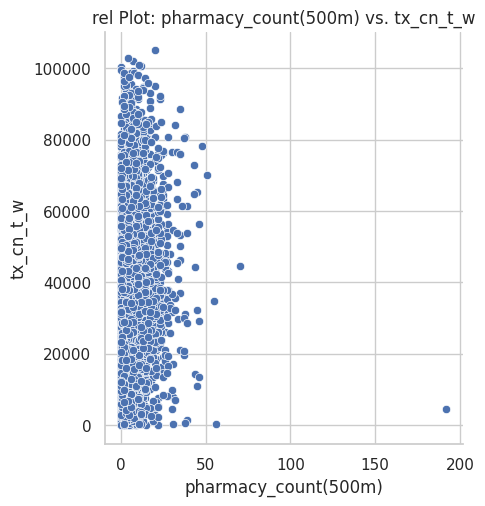

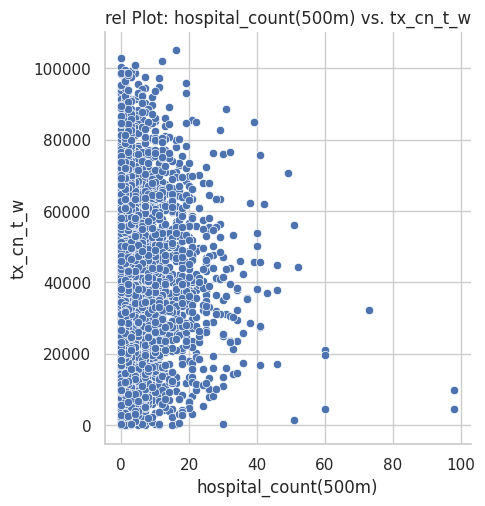

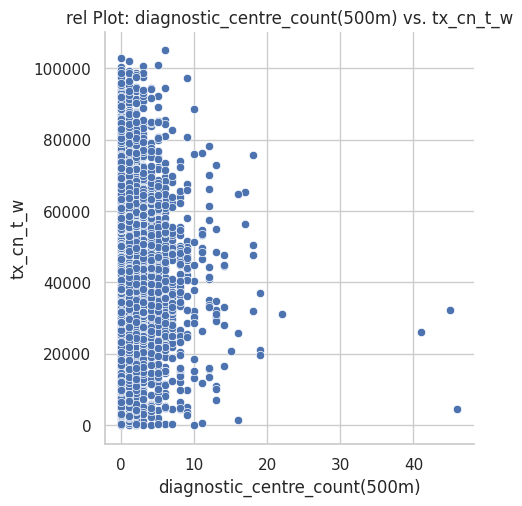

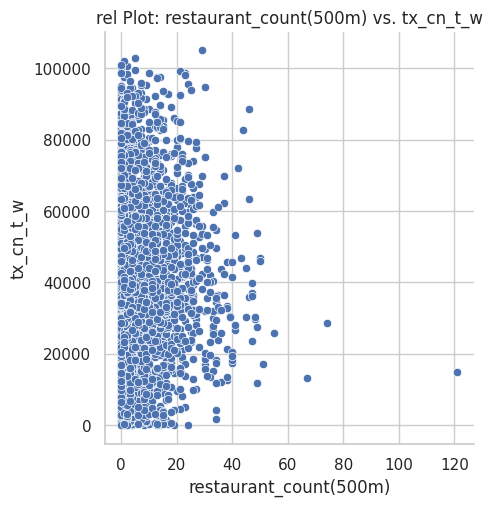

...

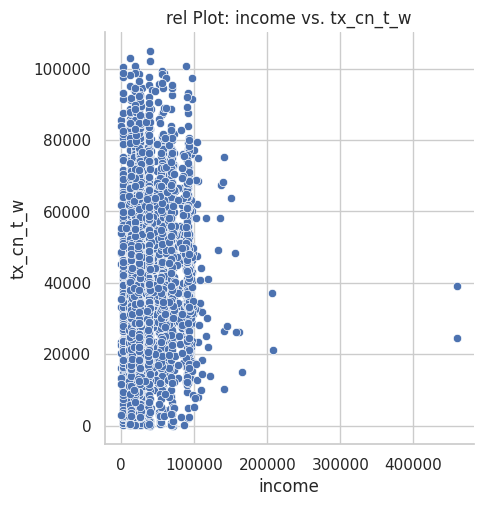

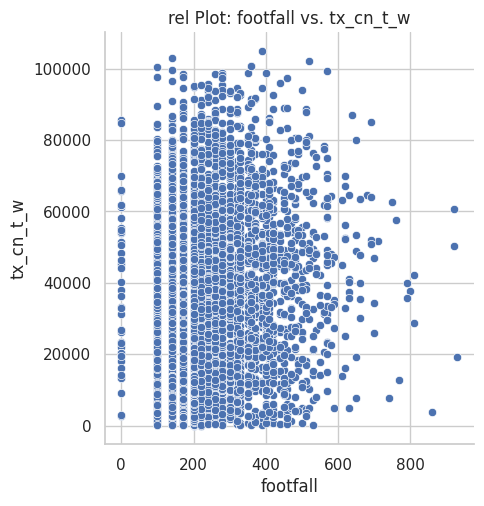

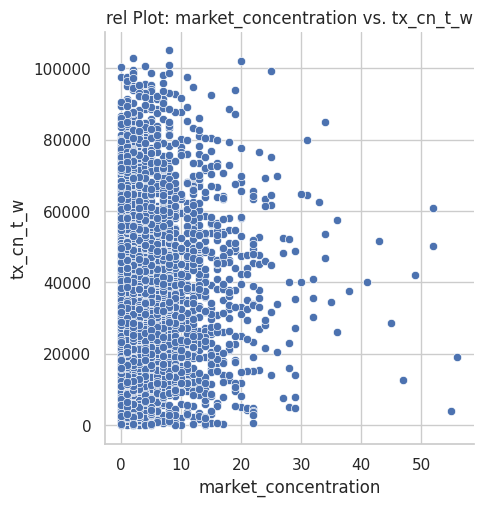

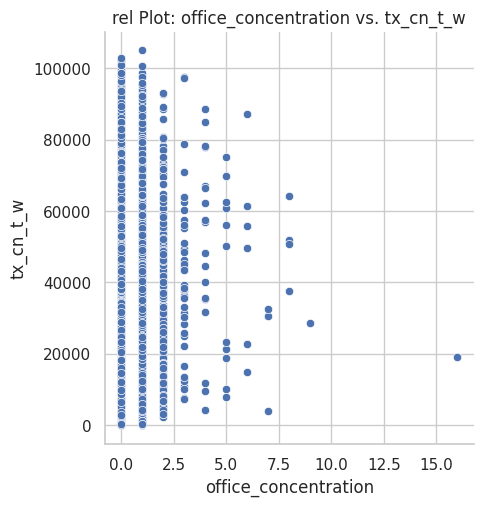

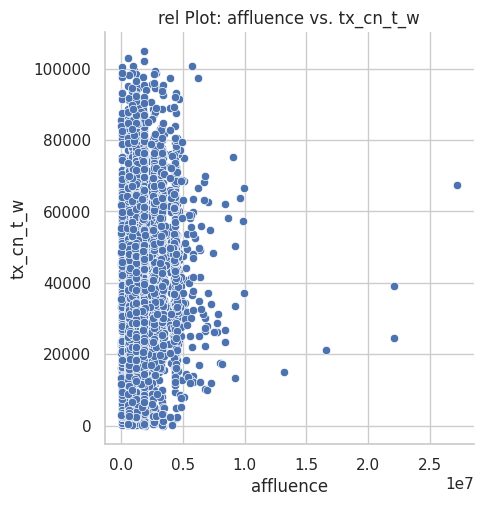

In [ ]:

plt.figure(figsize=(18, 15))  # Set the size of the figure
for col in new_cols:
    sns.relplot(x=result_df[col], y=result_df[target_column])
    plt.title(f'rel Plot: {col} vs. {target_column}')
    plt.xlabel(col)
    plt.ylabel(target_column)
    plt.show()

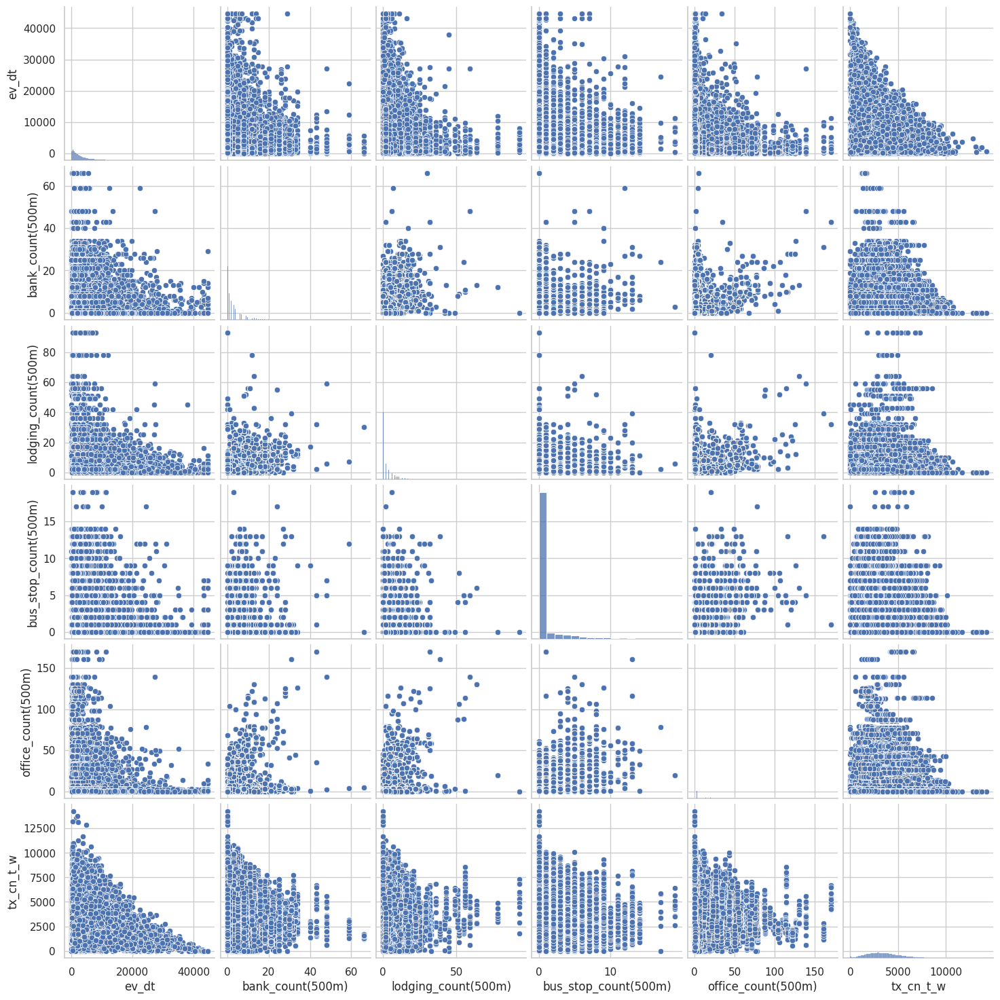

In [ ]:
columns_to_plot = ['ev_dt', 'bank_count(500m)',
                   'lodging_count(500m)', 'bus_stop_count(500m)', 'office_count(500m)','tx_cn_t_w']

# Create the pair plot for the selected columns
sns.pairplot(df[columns_to_plot])

<ipython-input-68-510a364fea57>:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(result_df.corr(), cmap = 'viridis',annot = True)


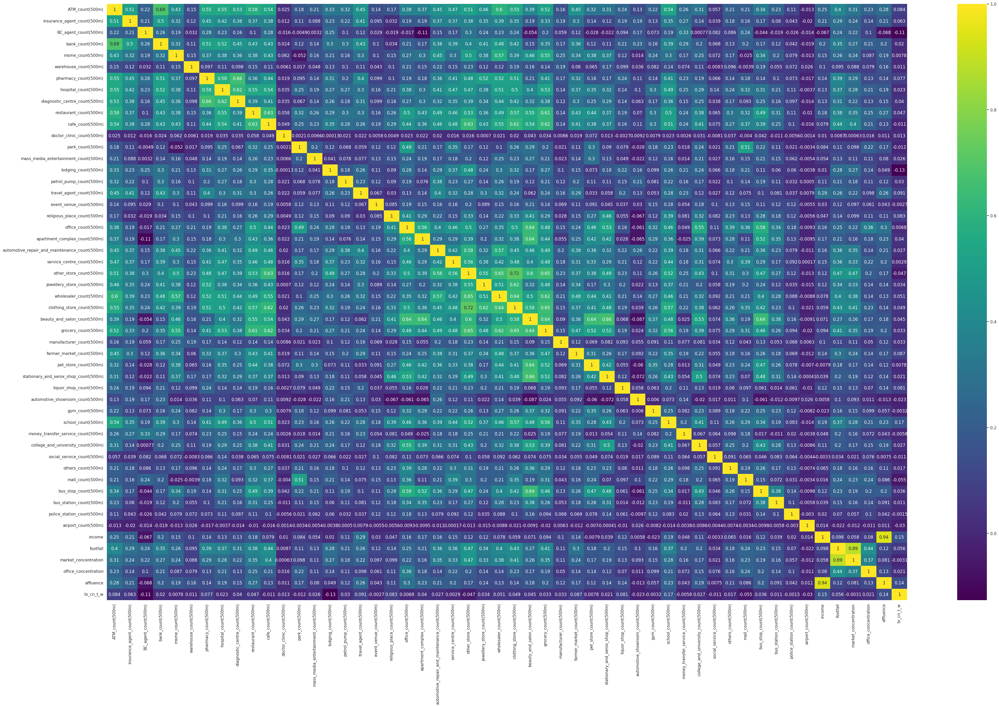

In [ ]:
#make a heatmap, see the correlation variables between variables . Do this for feature selection
sns.set(rc={'figure.figsize': (50, 30)})
sns.set(font_scale=1.2)
sns.set(style='whitegrid')
sns.heatmap(result_df.corr(), cmap = 'viridis',annot = True)
plt.show()

In [ ]:
result_df.isnull().sum()

atmid_current                                    0
ATM_count(500m)                                  0
insurance_agent_count(500m)                      0
BC_agent_count(500m)                             0
bank_count(500m)                                 0
msme_count(500m)                                 0
warehouse_count(500m)                            0
pharmacy_count(500m)                             0
hospital_count(500m)                             0
diagnostic_centre_count(500m)                    0
restaurant_count(500m)                           0
cafe_count(500m)                                 0
doctor_clinic_count(500m)                        0
park_count(500m)                                 0
mass_media_entertainment_count(500m)             0
lodging_count(500m)                              0
petrol_pump_count(500m)                          0
travel_agent_count(500m)                         0
event_venue_count(500m)                          0
religious_place_count(500m)    

In [ ]:
result_df.shape

(3975, 53)

In [ ]:
# Define the target variable
target = 'tx_cn_t_w'
# Separating features and target variable
#X = result_df.drop(columns=['tx_cn_t_w','atmid_current'], axis=1)
#y = result_df[target]



In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
# Splitting the data into training and testing sets
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [ ]:
# doing feature selection now
# will select only those variables which has greater correlation coefficient
# 1. Correlation Analysis
correlation_matrix = df.corr(numeric_only=True)
sorted_correlation = correlation_matrix['tx_cn_t_w'].abs().sort_values(ascending=False)
selected_features_correlation = sorted_correlation.index[:20]
# Display the selected features
print("Selected Features - Correlation Analysis:")
print(selected_features_correlation)
#copying selected features
df1=df[selected_features_correlation].copy()
#did not work


Selected Features - Correlation Analysis:
Index(['tx_cn_t_w', 'ev_dt', 'longitude', 'ds_pincode', 'bank_count(500m)',
       'lodging_count(500m)', 'bus_stop_count(500m)', 'office_count(500m)',
       'other_store_count(500m)', 'msme_count(500m)', 'pet_store_count(500m)',
       'apartment_complex_count(500m)', 'ATM_count(500m)',
       'beauty_and_salon_count(500m)',
       'automotive_repair_and_maintenance_count(500m)',
       'college_and_university_count(500m)', 'latitude', 'gym_count(500m)',
       'restaurant_count(500m)', 'hospital_count(500m)'],
      dtype='object')


In [ ]:
df1.columns.values.tolist()

['tx_cn_t_w',
 'ev_dt',
 'longitude',
 'ds_pincode',
 'bank_count(500m)',
 'lodging_count(500m)',
 'bus_stop_count(500m)',
 'office_count(500m)',
 'other_store_count(500m)',
 'msme_count(500m)',
 'pet_store_count(500m)',
 'apartment_complex_count(500m)',
 'ATM_count(500m)',
 'beauty_and_salon_count(500m)',
 'automotive_repair_and_maintenance_count(500m)',
 'college_and_university_count(500m)',
 'latitude',
 'gym_count(500m)',
 'restaurant_count(500m)',
 'hospital_count(500m)']

In [ ]:
X = df1.drop(columns = ['tx_cn_t_w'])
y = df1['tx_cn_t_w']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


In [ ]:
# other  methods  of feature selection
# 2. L1 Regularization (Lasso)
from sklearn.linear_model import Lasso
lasso_model = Lasso(alpha=0.01)  # You can experiment with different alpha values
lasso_model.fit(X, y)
selected_features_lasso = X.columns[lasso_model.coef_ != 0]
print("\nSelected Features - L1 Regularization (Lasso):")
print(selected_features_lasso)


Selected Features - L1 Regularization (Lasso):
Index(['ev_dt', 'longitude', 'ds_pincode', 'bank_count(500m)',
       'lodging_count(500m)', 'bus_stop_count(500m)', 'office_count(500m)',
       'other_store_count(500m)', 'msme_count(500m)', 'pet_store_count(500m)',
       'apartment_complex_count(500m)', 'ATM_count(500m)',
       'beauty_and_salon_count(500m)',
       'automotive_repair_and_maintenance_count(500m)',
       'college_and_university_count(500m)', 'latitude', 'gym_count(500m)',
       'restaurant_count(500m)', 'hospital_count(500m)'],
      dtype='object')


In [ ]:
# 3. Recursive Feature Elimination (RFE) with Linear Regression
from sklearn.feature_selection import RFE
rfe_model = RFE(estimator=LinearRegression(), n_features_to_select=5)
rfe_model.fit(X, y)
# Get the selected features from RFE
selected_features_rfe = X_train.columns[rfe_model.support_]
# Print the selected feature names
print("Selected Features:")
print(selected_features_rfe)




Selected Features:
Index(['longitude', 'bus_stop_count(500m)', 'pet_store_count(500m)',
       'latitude', 'gym_count(500m)'],
      dtype='object')


In [ ]:
# Initialize SelectKBest with the f_regression scoring function
k_best = SelectKBest(score_func=f_regression, k=10)  # Select the top 5 features

# Fit the feature selector to the training data
X_train_k_best = k_best.fit_transform(X_train, y_train)

# Get the indices of the selected features
selected_indices = k_best.get_support(indices=True)

# Get the names of the selected features
selected_features = X.columns[selected_indices]

# Print the selected feature names
print("Selected Features:")
print(selected_features)

Selected Features:
Index(['ev_dt', 'longitude', 'ds_pincode', 'bank_count(500m)',
       'lodging_count(500m)', 'bus_stop_count(500m)', 'office_count(500m)',
       'msme_count(500m)', 'pet_store_count(500m)',
       'apartment_complex_count(500m)'],
      dtype='object')


In [ ]:
df1.columns.values.tolist()

['tx_cn_t_w',
 'ev_dt',
 'longitude',
 'ds_pincode',
 'bank_count(500m)',
 'lodging_count(500m)',
 'bus_stop_count(500m)',
 'office_count(500m)',
 'other_store_count(500m)',
 'msme_count(500m)',
 'pet_store_count(500m)',
 'apartment_complex_count(500m)',
 'ATM_count(500m)',
 'beauty_and_salon_count(500m)',
 'automotive_repair_and_maintenance_count(500m)',
 'college_and_university_count(500m)',
 'latitude',
 'gym_count(500m)',
 'restaurant_count(500m)',
 'hospital_count(500m)']

In [ ]:
# Transform X_train and X_test to contain only the selected features
#X_train_selected = X_train[selected_features_correlation]
#X_test_selected = X_test[selected_features_correlation]



In [ ]:
from sklearn.preprocessing import StandardScaler
# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
#Trying lasso ridge regression
from sklearn.linear_model import ElasticNet
from sklearn.metrics import mean_squared_error, r2_score
# Elastic Net Regression (Lasso and Ridge together)
alpha = 0.3
l1_ratio = 0.5

elastic_net = ElasticNet(alpha=alpha, l1_ratio=l1_ratio)
elastic_net.fit(X_train_scaled, y_train)

# Predictions
y_pred = elastic_net.predict(X_test_scaled)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Elastic Net Regression (Lasso and Ridge together):")
print("Mean Squared Error (MSE):", mse)
print("R-squared (R2) Score:", r2)


Elastic Net Regression (Lasso and Ridge together):
Mean Squared Error (MSE): 2505066.5635990323
R-squared (R2) Score: 0.10710745794309529


In [ ]:
pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.9/547.9 kB 9.7 MB/s eta 0:00:00


In [ ]:
# Decision Tree Regressor
from sklearn.tree import DecisionTreeRegressor
decision_tree_regressor = DecisionTreeRegressor(random_state=42)
decision_tree_regressor.fit(X_train_scaled, y_train)
y_pred_dt = decision_tree_regressor.predict(X_test_scaled)

In [ ]:
mse_dt = mean_squared_error(y_test, y_pred_dt)
r2_dt = r2_score(y_test, y_pred_dt)
print("\nDecision Tree Regression:")
print("Mean Squared Error (MSE):", mse_dt)
print("R-squared (R2) Score:", r2_dt)

# HENCE NOT GOOD


Decision Tree Regression:
Mean Squared Error (MSE): 1268458.3718917842
R-squared (R2) Score: 0.5478774749423767


In [ ]:
#LINEAR REGRESSION
from sklearn.linear_model import LinearRegression
lg=LinearRegression()
model=LinearRegression()
model.fit(X_train_scaled,y_train)

LinearRegression()

In [ ]:
pred=model.predict(X_test_scaled)



In [ ]:
mse = mean_squared_error(y_test, pred)
r2 = r2_score(y_test, pred)
print(mse)
print(r2)

2487270.4631518195
0.11345060490689618


In [ ]:
#finally using linear regression / elastic-net regression
data1= pd.DataFrame({'Actual Transactions': y_test, 'Predicted Transactions': y_pred})
data1
# using lasso ridge regression

,Actual Transactions,Predicted Transactions
18310,1083.0,3877.575189
3737,3341.0,3437.773632
14857,4532.0,3846.458748
38008,357.0,3875.962405
9026,0.0,1059.614240
...,...,...
38718,7275.0,3706.533146
32637,2501.0,2651.777940
1588,10100.0,3314.175196
12739,1534.0,3916.329085


In [ ]:
data1= pd.DataFrame({'Actual Transactions': y_test, 'Predicted Transactions': pred})
data1
# using linear regression

,Actual Transactions,Predicted Transactions
18310,1083.0,3859.634759
3737,3341.0,3430.839865
14857,4532.0,3877.574811
38008,357.0,4005.438950
9026,0.0,712.517995
...,...,...
38718,7275.0,3931.694986
32637,2501.0,2533.008794
1588,10100.0,3161.533773
12739,1534.0,4049.698369


In [ ]:
#grouped_df = result_df[['atmid_current','tx_cn_t_w ']].copy()

# Predict transactions using the model
#grouped_df['Predicted_Transactions'] = model.predict(grouped_df[['atmid_current']])

# Display the DataFrame with actual and predicted transactions
y_hats_df = pd.DataFrame(data = y_pred, columns = ['pred'], index = X_test.index.copy())
df_out = pd.merge(result_df, y_hats_df, left_index = True, right_index = True)

df_out

,atmid_current,ATM_count(500m),insurance_agent_count(500m),BC_agent_count(500m),bank_count(500m),msme_count(500m),warehouse_count(500m),pharmacy_count(500m),hospital_count(500m),diagnostic_centre_count(500m),...,bus_station_count(500m),police_station_count(500m),airport_count(500m),income,footfall,market_concentration,office_concentration,affluence,tx_cn_t_w,pred
0,T1BH000003039,1.0,1.0,7.0,0.0,6.0,0.0,2.0,5.0,0.0,...,0.0,0.0,0.0,1800.0,350.0,7.0,0.0,88000.0,5582.0,3862.094108
1,T1BH000003040,0.0,1.0,7.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1800.0,220.0,4.0,0.0,87000.0,4495.0,3873.186937
4,T1BH000006151,5.0,1.0,9.0,0.0,54.0,1.0,18.0,11.0,7.0,...,0.0,0.0,0.0,75700.0,370.0,8.0,0.0,3633000.0,46862.0,3960.392609
7,T1BH000006199,1.0,0.0,1.0,1.0,53.0,0.0,5.0,2.0,1.0,...,0.0,0.0,0.0,58100.0,330.0,9.0,0.0,2787000.0,4224.0,3801.083549
11,T1BH000010043,15.0,2.0,12.0,10.0,111.0,0.0,16.0,26.0,9.0,...,0.0,0.0,0.0,25600.0,140.0,0.0,0.0,1228000.0,9998.0,3954.378425
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4402,T1NY070103048,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,...,0.0,0.0,0.0,23000.0,170.0,1.0,0.0,1103000.0,50307.0,3406.731502
4408,T1NY070147097,1.0,0.0,0.0,1.0,20.0,0.0,4.0,4.0,1.0,...,0.0,0.0,0.0,67700.0,170.0,2.0,0.0,3251000.0,53013.0,3388.361152
4413,T1NY070170036,1.0,1.0,3.0,0.0,4.0,0.0,1.0,1.0,0.0,...,0.0,0.0,0.0,89500.0,220.0,3.0,0.0,4297000.0,60807.0,3299.618521
4416,T1NY070334025,1.0,0.0,0.0,1.0,6.0,0.0,1.0,2.0,0.0,...,0.0,0.0,0.0,90100.0,200.0,3.0,1.0,4326000.0,43180.0,2939.368882


In [ ]:
from sklearn import metrics
MAE_xb=metrics.mean_absolute_error(y_test,y_pred)
MSE_xb=metrics.mean_squared_error(y_test,y_pred)
RMSE_xb=np.sqrt(MSE_xb)

print(MAE_xb)
print(MSE_xb)
print(RMSE_xb)

1253.4976953176042
2505066.5635990323
1582.7402072352343


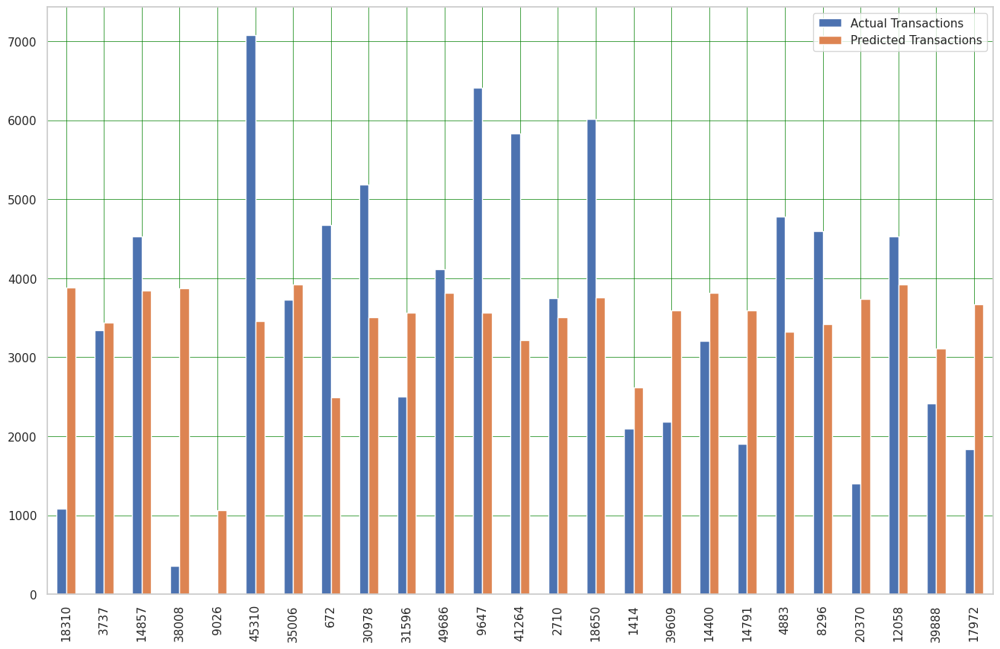

In [ ]:
#plotting graph of prediction vs actual value
df1 = data1.head(25)
df1.plot(kind='bar',figsize=(16,10))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.show()

In [ ]:

import xgboost as xgb

model_xgb=xgb.XGBRegressor()
model_xgb.fit(X_train_scaled,y_train)
pred1=model_xgb.predict(X_test_scaled)

In [ ]:
data2= pd.DataFrame({'Actual': y_test, 'Predicted': pred1})
data2

,Actual,Predicted
18310,1083.0,2162.107422
3737,3341.0,4099.536133
14857,4532.0,4254.152832
38008,357.0,3823.259766
9026,0.0,1256.777954
...,...,...
38718,7275.0,2334.784180
32637,2501.0,3311.390869
1588,10100.0,6467.885742
12739,1534.0,2716.415039


In [ ]:
y_hats_df = pd.DataFrame(data = pred1, columns = ['pred1'], index = X_test.index.copy())
df_out = pd.merge(result_df, y_hats_df, left_index = True, right_index = True)


df_out.rename(columns = {'tx_cn_t_w':'Actual Transactions'}, inplace = True)
df_out.rename(columns = {'pred1':'Predicted Transactions'}, inplace = True)
df_out

,atmid_current,ATM_count(500m),insurance_agent_count(500m),BC_agent_count(500m),bank_count(500m),msme_count(500m),warehouse_count(500m),pharmacy_count(500m),hospital_count(500m),diagnostic_centre_count(500m),...,bus_station_count(500m),police_station_count(500m),airport_count(500m),income,footfall,market_concentration,office_concentration,affluence,Actual Transactions,Predicted Transactions
0,T1BH000003039,1.0,1.0,7.0,0.0,6.0,0.0,2.0,5.0,0.0,...,0.0,0.0,0.0,1800.0,350.0,7.0,0.0,88000.0,5582.0,3784.634521
1,T1BH000003040,0.0,1.0,7.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1800.0,220.0,4.0,0.0,87000.0,4495.0,3823.839844
4,T1BH000006151,5.0,1.0,9.0,0.0,54.0,1.0,18.0,11.0,7.0,...,0.0,0.0,0.0,75700.0,370.0,8.0,0.0,3633000.0,46862.0,3694.519287
7,T1BH000006199,1.0,0.0,1.0,1.0,53.0,0.0,5.0,2.0,1.0,...,0.0,0.0,0.0,58100.0,330.0,9.0,0.0,2787000.0,4224.0,3917.667236
11,T1BH000010043,15.0,2.0,12.0,10.0,111.0,0.0,16.0,26.0,9.0,...,0.0,0.0,0.0,25600.0,140.0,0.0,0.0,1228000.0,9998.0,3739.539551
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4402,T1NY070103048,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,...,0.0,0.0,0.0,23000.0,170.0,1.0,0.0,1103000.0,50307.0,4479.962891
4408,T1NY070147097,1.0,0.0,0.0,1.0,20.0,0.0,4.0,4.0,1.0,...,0.0,0.0,0.0,67700.0,170.0,2.0,0.0,3251000.0,53013.0,4819.498535
4413,T1NY070170036,1.0,1.0,3.0,0.0,4.0,0.0,1.0,1.0,0.0,...,0.0,0.0,0.0,89500.0,220.0,3.0,0.0,4297000.0,60807.0,4736.125488
4416,T1NY070334025,1.0,0.0,0.0,1.0,6.0,0.0,1.0,2.0,0.0,...,0.0,0.0,0.0,90100.0,200.0,3.0,1.0,4326000.0,43180.0,4012.578613


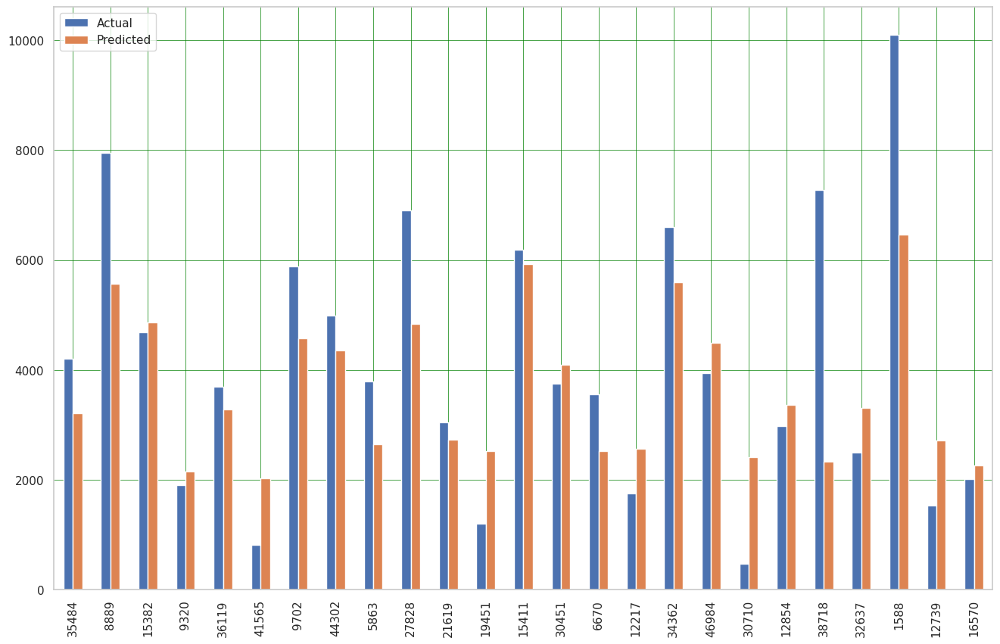

In [ ]:
#predic value vs actual
df1 = data2.tail(25)
df1.plot(kind='bar',figsize=(16,10))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.show()

In [ ]:
from sklearn import metrics
MAE_xb=metrics.mean_absolute_error(y_test,pred1)
MSE_xb=metrics.mean_squared_error(y_test,pred1)
RMSE_xb=np.sqrt(MSE_xb)

print(MAE_xb)
print(MSE_xb)
print(RMSE_xb)



739.6594481480532
961872.0610518499
980.7507639822923


In [ ]:
# plotting feature importance according to model

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


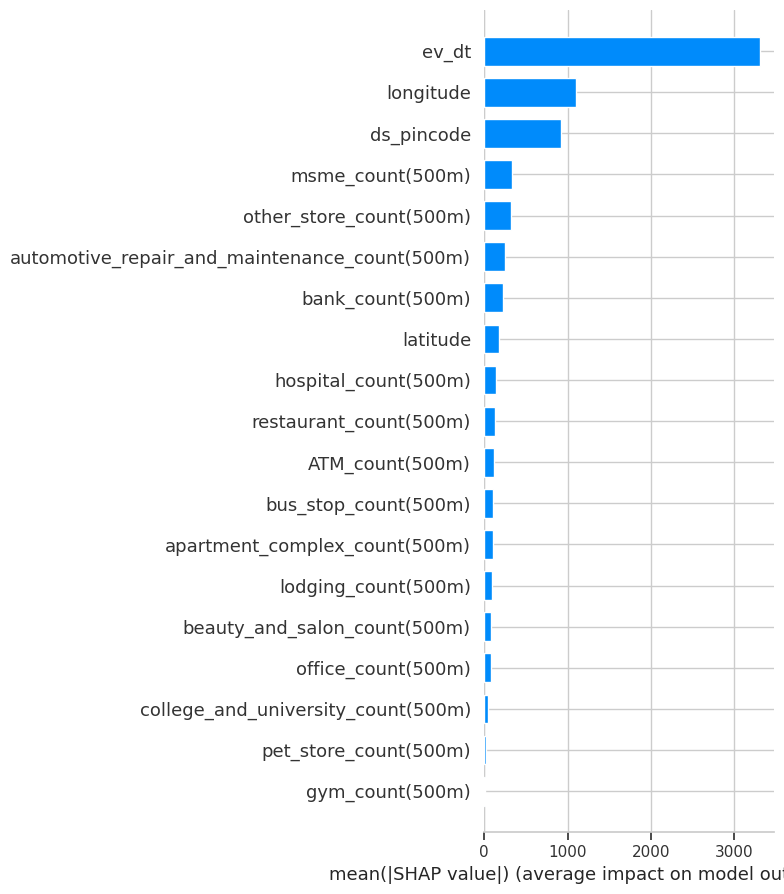

In [ ]:

#feature importance
import shap
shap_values = shap.TreeExplainer(model_xgb).shap_values(X_test)
shap.summary_plot(shap_values, X_test, plot_type="bar")